In [3]:
import os
import glob
import numpy as np
import rasterio
import matplotlib.pyplot as plt

In [4]:
aligned_dir = "../data_aligned"

print("Current working directory:")
print(os.getcwd())

print("\nDoes aligned_dir exist?")
print(os.path.exists(aligned_dir))

print("\nFiles in aligned_dir:")
for f in glob.glob(os.path.join(aligned_dir, "*.tif")):
    print(" -", os.path.basename(f))

Current working directory:
C:\Users\ROG\Desktop\uav_navigation_project\notebook

Does aligned_dir exist?
True

Files in aligned_dir:
 - dtm_aligned.tif
 - gndvi_aligned.tif
 - ndre_aligned.tif
 - ndvi_aligned.tif
 - ndwi_aligned.tif
 - rel_height_aligned.tif
 - roughness_aligned.tif
 - slope_aligned.tif


In [5]:
feature_order = [
    "ndvi",
    "ndre",
    "gndvi",
    "ndwi",
    "slope",
    "roughness",
    "rel_height",
    "dtm"
]

In [6]:
aligned_rasters = {}
profiles = {}

for name in feature_order:
    path = os.path.join(aligned_dir, f"{name}_aligned.tif")
    
    if not os.path.exists(path):
        raise FileNotFoundError(f"Missing file: {path}")
    
    with rasterio.open(path) as src:
        arr = src.read(1).astype("float32")
        nodata = src.nodata
        
        if nodata is not None:
            arr[arr == nodata] = np.nan
        
        aligned_rasters[name] = arr
        profiles[name] = src.profile.copy()

print("All rasters loaded successfully.")

All rasters loaded successfully.


In [7]:
print("Raster shape check:")

for name in feature_order:
    arr = aligned_rasters[name]
    print(f"{name:12s} shape = {arr.shape}")

Raster shape check:
ndvi         shape = (1169, 1519)
ndre         shape = (1169, 1519)
gndvi        shape = (1169, 1519)
ndwi         shape = (1169, 1519)
slope        shape = (1169, 1519)
roughness    shape = (1169, 1519)
rel_height   shape = (1169, 1519)
dtm          shape = (1169, 1519)


In [8]:
print("Basic statistics:")

for name in feature_order:
    arr = aligned_rasters[name]
    
    valid = np.isfinite(arr)
    
    print("\n", name)
    print("  valid ratio:", valid.mean())
    print("  min:", np.nanmin(arr))
    print("  max:", np.nanmax(arr))
    print("  mean:", np.nanmean(arr))
    print("  p2:", np.nanpercentile(arr, 2))
    print("  p98:", np.nanpercentile(arr, 98))

Basic statistics:

 ndvi
  valid ratio: 0.5914188739045937
  min: -0.47990656
  max: 0.6698294
  mean: 0.375398
  p2: -0.34389278
  p98: 0.6261523

 ndre
  valid ratio: 0.5914188739045937
  min: -0.35319573
  max: 0.1716958
  mean: -0.024748402
  p2: -0.17410345
  p98: 0.10135923

 gndvi
  valid ratio: 0.5914188739045937
  min: -0.5645691
  max: 0.4190333
  mean: 0.15030527
  p2: -0.390283
  p98: 0.36069867

 ndwi
  valid ratio: 0.5914188739045937
  min: -0.4190333
  max: 0.5645691
  mean: -0.15030527
  p2: -0.36069867
  p98: 0.390283

 slope
  valid ratio: 0.5889370511305049
  min: 0.0
  max: 88.0073
  mean: 17.241587
  p2: 2.1959813
  p98: 54.77697

 roughness
  valid ratio: 0.5889370511305049
  min: 0.0
  max: 6.2199793
  mean: 0.08019065
  p2: 0.010000229
  p98: 0.32953003

 rel_height
  valid ratio: 0.5916784882224642
  min: -0.9491563
  max: 12.188643
  mean: 0.5493356
  p2: -0.008534066
  p98: 6.190313

 dtm
  valid ratio: 0.5919623181925437
  min: 8.18
  max: 31.6
  mean: 20.16

In [9]:
valid_mask = np.ones_like(aligned_rasters["dtm"], dtype=bool)

for name in feature_order:
    valid_mask &= np.isfinite(aligned_rasters[name])

print("Total pixels:", valid_mask.size)
print("Valid pixels:", valid_mask.sum())
print("Invalid pixels:", valid_mask.size - valid_mask.sum())
print("Valid ratio:", valid_mask.mean())

Total pixels: 1775711
Valid pixels: 1045782
Invalid pixels: 729929
Valid ratio: 0.5889370511305049


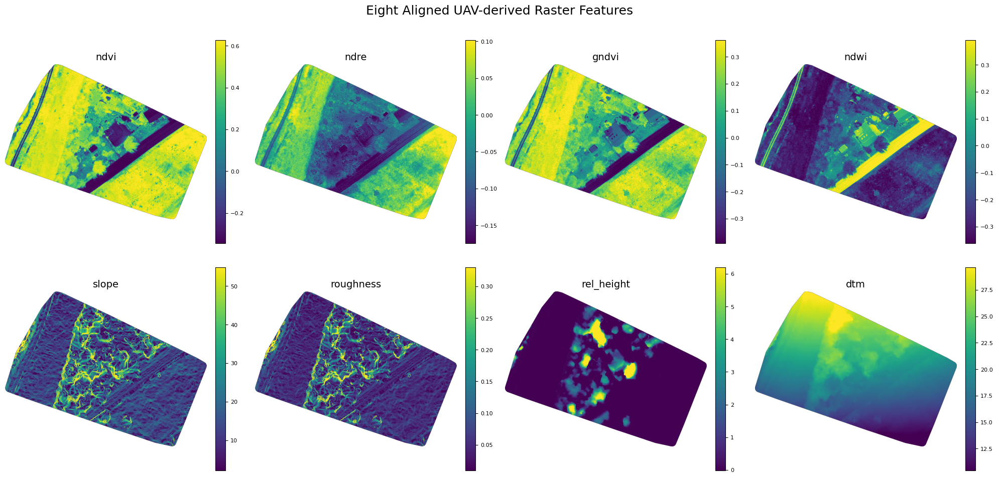

Saved figure to: ../outputs/deep_traversability\01_input_features_preview.png


In [10]:
out_dir = "../outputs/deep_traversability"
os.makedirs(out_dir, exist_ok=True)

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for ax, name in zip(axes.ravel(), feature_order):
    arr = aligned_rasters[name]
    
    # mask NaN for display
    arr_plot = np.ma.masked_invalid(arr)
    
    # robust display range
    vmin = np.nanpercentile(arr, 2)
    vmax = np.nanpercentile(arr, 98)
    
    im = ax.imshow(arr_plot, cmap="viridis", vmin=vmin, vmax=vmax)
    ax.set_title(name, fontsize=14)
    ax.axis("off")
    
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=8)

plt.suptitle("Eight Aligned UAV-derived Raster Features", fontsize=18)
plt.tight_layout()

save_path = os.path.join(out_dir, "01_input_features_preview.png")
plt.savefig(save_path, dpi=200)
plt.show()

print("Saved figure to:", save_path)

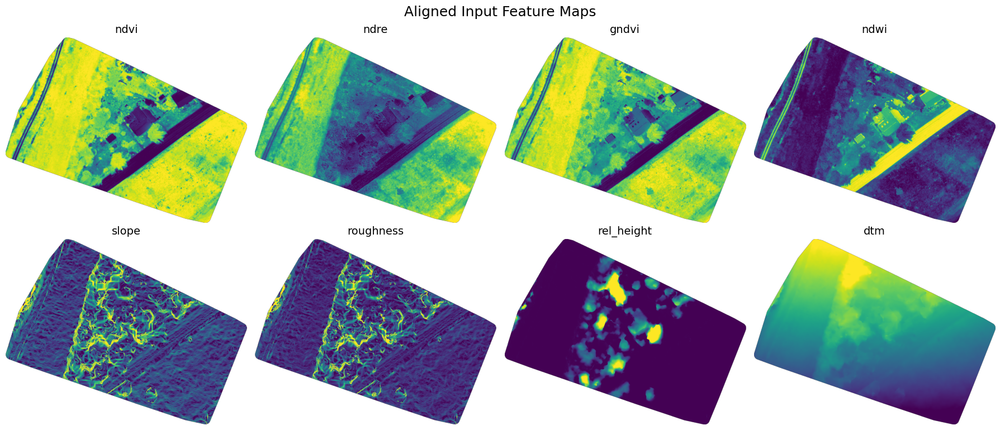

Saved clean figure to: ../outputs/deep_traversability\01_input_features_preview_clean.png


In [11]:
fig, axes = plt.subplots(2, 4, figsize=(18, 8))

for ax, name in zip(axes.ravel(), feature_order):
    arr = aligned_rasters[name]
    arr_plot = np.ma.masked_invalid(arr)
    
    vmin = np.nanpercentile(arr, 2)
    vmax = np.nanpercentile(arr, 98)
    
    ax.imshow(arr_plot, cmap="viridis", vmin=vmin, vmax=vmax)
    ax.set_title(name, fontsize=14)
    ax.axis("off")

plt.suptitle("Aligned Input Feature Maps", fontsize=18)
plt.tight_layout()

save_path_clean = os.path.join(out_dir, "01_input_features_preview_clean.png")
plt.savefig(save_path_clean, dpi=250)
plt.show()

print("Saved clean figure to:", save_path_clean)

In [12]:
def robust_norm(arr, mask, q_low=2, q_high=98, invert=False):
    """
    Convert a raster layer into [0, 1] using robust percentile clipping.
    
    arr:
        input raster, shape [H, W]
    mask:
        valid pixels, shape [H, W]
    q_low, q_high:
        percentile range
    invert:
        if True, high original values become low risk
    """
    out = np.full(arr.shape, np.nan, dtype=np.float32)
    
    values = arr[mask & np.isfinite(arr)]
    
    if len(values) == 0:
        raise ValueError("No valid values found for normalization.")
    
    low = np.nanpercentile(values, q_low)
    high = np.nanpercentile(values, q_high)
    
    print(f"Percentile range: {low:.4f} to {high:.4f}")
    
    if np.isclose(high, low):
        out[mask] = 0.0
        return out
    
    norm = (arr - low) / (high - low)
    norm = np.clip(norm, 0.0, 1.0)
    
    if invert:
        norm = 1.0 - norm
    
    out[mask] = norm[mask]
    return out

In [13]:
# Terrain geometry risks
slope_risk = robust_norm(
    aligned_rasters["slope"],
    valid_mask,
    q_low=5,
    q_high=95
)

roughness_risk = robust_norm(
    aligned_rasters["roughness"],
    valid_mask,
    q_low=5,
    q_high=95
)

rel_height_risk = robust_norm(
    aligned_rasters["rel_height"],
    valid_mask,
    q_low=50,
    q_high=99
)

# Vegetation-related risks
ndvi_risk = robust_norm(
    aligned_rasters["ndvi"],
    valid_mask,
    q_low=10,
    q_high=95
)

ndre_risk = robust_norm(
    aligned_rasters["ndre"],
    valid_mask,
    q_low=10,
    q_high=95
)

gndvi_risk = robust_norm(
    aligned_rasters["gndvi"],
    valid_mask,
    q_low=10,
    q_high=95
)

# Safer vegetation risk calculation: only compute inside valid_mask
veg_stack = np.stack([ndvi_risk, ndre_risk, gndvi_risk], axis=0)

vegetation_risk = np.full_like(ndvi_risk, np.nan, dtype=np.float32)

vegetation_risk[valid_mask] = np.nanmean(
    veg_stack[:, valid_mask],
    axis=0
)

# Water / wetness risk
# Your NDWI = (Green - NIR) / (Green + NIR)
# Higher NDWI means higher water/wetness risk, so invert=False.
water_risk = robust_norm(
    aligned_rasters["ndwi"],
    valid_mask,
    q_low=5,
    q_high=95,
    invert=False
)

print("Risk layers generated.")
print("Vegetation risk min:", np.nanmin(vegetation_risk))
print("Vegetation risk max:", np.nanmax(vegetation_risk))
print("Vegetation risk mean:", np.nanmean(vegetation_risk))

Percentile range: 3.7931 to 43.6928
Percentile range: 0.0168 to 0.2221
Percentile range: 0.0100 to 7.9354
Percentile range: -0.2180 to 0.6149
Percentile range: -0.1366 to 0.0839
Percentile range: -0.1524 to 0.3465
Percentile range: -0.3465 to 0.3654
Risk layers generated.
Vegetation risk min: 0.0
Vegetation risk max: 1.0
Vegetation risk mean: 0.62590677


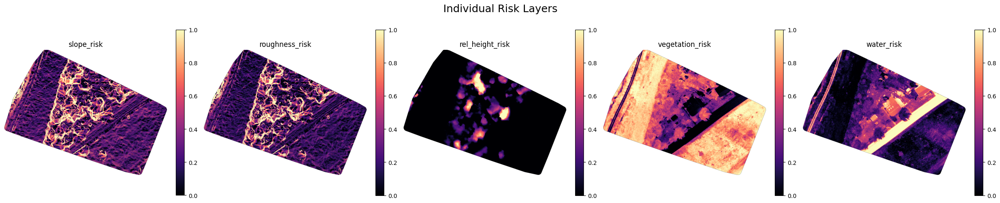

Saved: ../outputs/deep_traversability\02_individual_risk_layers.png


In [14]:
risk_layers = {
    "slope_risk": slope_risk,
    "roughness_risk": roughness_risk,
    "rel_height_risk": rel_height_risk,
    "vegetation_risk": vegetation_risk,
    "water_risk": water_risk
}

fig, axes = plt.subplots(1, 5, figsize=(24, 5))

for ax, (name, arr) in zip(axes.ravel(), risk_layers.items()):
    arr_plot = np.ma.masked_invalid(arr)
    
    im = ax.imshow(arr_plot, cmap="magma", vmin=0, vmax=1)
    ax.set_title(name)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046)

plt.suptitle("Individual Risk Layers", fontsize=18)
plt.tight_layout()

save_path = os.path.join(out_dir, "02_individual_risk_layers.png")
plt.savefig(save_path, dpi=200)
plt.show()

print("Saved:", save_path)

In [15]:
# Because high NDWI areas correspond to roads in this dataset,
# NDWI is not reliable enough for automatic water obstacle detection.
# We disable automatic water obstacle mask for now.

water_obstacle_mask = np.zeros_like(valid_mask, dtype=bool)

print("Water obstacle mask is disabled for this dataset.")
print("Water obstacle pixels:", water_obstacle_mask.sum())
print("Water obstacle ratio inside valid area:", water_obstacle_mask[valid_mask].mean())

Water obstacle mask is disabled for this dataset.
Water obstacle pixels: 0
Water obstacle ratio inside valid area: 0.0


In [16]:
pseudo_label_weights = {
    "slope": 0.32,
    "roughness": 0.28,
    "rel_height": 0.15,
    "vegetation": 0.25,
    "water": 0.00
}

print("Pseudo-label generation weights:")
for k, v in pseudo_label_weights.items():
    print(f"{k}: {v}")

print("Total weight:", sum(pseudo_label_weights.values()))

Pseudo-label generation weights:
slope: 0.32
roughness: 0.28
rel_height: 0.15
vegetation: 0.25
water: 0.0
Total weight: 1.0


In [17]:
pseudo_risk = (
    pseudo_label_weights["slope"] * slope_risk +
    pseudo_label_weights["roughness"] * roughness_risk +
    pseudo_label_weights["rel_height"] * rel_height_risk +
    pseudo_label_weights["vegetation"] * vegetation_risk +
    pseudo_label_weights["water"] * water_risk
)

pseudo_risk = np.clip(pseudo_risk, 0.0, 1.0)
pseudo_risk[~valid_mask] = np.nan

print("Pseudo risk min:", np.nanmin(pseudo_risk))
print("Pseudo risk max:", np.nanmax(pseudo_risk))
print("Pseudo risk mean:", np.nanmean(pseudo_risk))

Pseudo risk min: 0.0
Pseudo risk max: 0.9677547
Pseudo risk mean: 0.34717855


In [18]:
risk_layers_for_contribution = {
    "slope": slope_risk,
    "roughness": roughness_risk,
    "rel_height": rel_height_risk,
    "vegetation": vegetation_risk,
    "water": water_risk
}

print("Mean weighted contribution:")

total_mean_contribution = 0.0
mean_contributions = {}

for name, layer in risk_layers_for_contribution.items():
    contribution = pseudo_label_weights[name] * layer
    mean_contribution = np.nanmean(contribution[valid_mask])
    mean_contributions[name] = mean_contribution
    total_mean_contribution += mean_contribution
    print(f"{name}: {mean_contribution:.4f}")

print("\nTotal mean contribution:", total_mean_contribution)

print("\nRelative contribution percentage:")

for name, mean_contribution in mean_contributions.items():
    if total_mean_contribution > 0:
        percentage = mean_contribution / total_mean_contribution * 100
    else:
        percentage = 0
    print(f"{name}: {percentage:.2f}%")

Mean weighted contribution:
slope: 0.1041
roughness: 0.0766
rel_height: 0.0100
vegetation: 0.1565
water: 0.0000

Total mean contribution: 0.34717858

Relative contribution percentage:
slope: 29.99%
roughness: 22.05%
rel_height: 2.89%
vegetation: 45.07%
water: 0.00%


In [19]:
rel_height = aligned_rasters["rel_height"]
slope = aligned_rasters["slope"]
roughness = aligned_rasters["roughness"]

# 初始阈值，可以后面根据结果调整
rel_height_threshold = 1.0

slope_extreme_threshold = np.nanpercentile(slope[valid_mask], 99.5)
roughness_extreme_threshold = np.nanpercentile(roughness[valid_mask], 99.5)

pseudo_obstacle = (
    (~valid_mask) |
    water_obstacle_mask |
    (rel_height > rel_height_threshold) |
    (slope > slope_extreme_threshold) |
    (roughness > roughness_extreme_threshold)
)

print("Rel height threshold:", rel_height_threshold)
print("Slope extreme threshold:", slope_extreme_threshold)
print("Roughness extreme threshold:", roughness_extreme_threshold)
print("Obstacle pixels:", pseudo_obstacle.sum())
print("Obstacle ratio:", pseudo_obstacle.sum() / pseudo_obstacle.size)
print("Obstacle ratio inside valid area:", pseudo_obstacle[valid_mask].mean())
print("Water obstacle ratio inside valid area:", water_obstacle_mask[valid_mask].mean())

Rel height threshold: 1.0
Slope extreme threshold: 67.5868
Roughness extreme threshold: 0.5627085
Obstacle pixels: 895225
Obstacle ratio: 0.5041501685803602
Obstacle ratio inside valid area: 0.15805971034116098
Water obstacle ratio inside valid area: 0.0


In [20]:
from scipy.ndimage import gaussian_filter

risk_for_smoothing = np.where(
    np.isfinite(pseudo_risk) & (~pseudo_obstacle),
    pseudo_risk,
    0.0
)

valid_for_smoothing = (
    np.isfinite(pseudo_risk) & (~pseudo_obstacle)
).astype(np.float32)

risk_sum = gaussian_filter(risk_for_smoothing, sigma=1.0)
valid_sum = gaussian_filter(valid_for_smoothing, sigma=1.0)

pseudo_risk_smooth = risk_sum / np.maximum(valid_sum, 1e-6)

# Obstacles are high-risk in label
pseudo_risk_smooth[pseudo_obstacle] = 1.0

# Invalid area remains NaN
pseudo_risk_smooth[~valid_mask] = np.nan

print("Smoothed pseudo risk generated.")
print("Pseudo risk smooth min:", np.nanmin(pseudo_risk_smooth))
print("Pseudo risk smooth max:", np.nanmax(pseudo_risk_smooth))
print("Pseudo risk smooth mean:", np.nanmean(pseudo_risk_smooth))

Smoothed pseudo risk generated.
Pseudo risk smooth min: 2.3796376e-10
Pseudo risk smooth max: 1.0
Pseudo risk smooth mean: 0.4363187


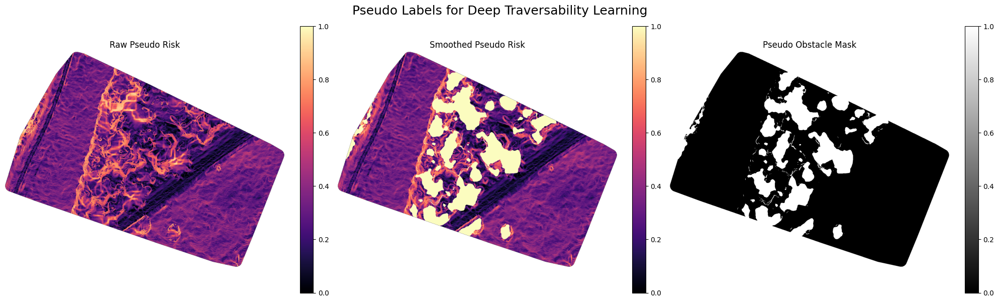

Saved: ../outputs/deep_traversability\04_pseudo_labels.png


In [21]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

im0 = axes[0].imshow(
    np.ma.masked_invalid(pseudo_risk),
    cmap="magma",
    vmin=0,
    vmax=1
)
axes[0].set_title("Raw Pseudo Risk")
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], fraction=0.046)

im1 = axes[1].imshow(
    np.ma.masked_invalid(pseudo_risk_smooth),
    cmap="magma",
    vmin=0,
    vmax=1
)
axes[1].set_title("Smoothed Pseudo Risk")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046)

im2 = axes[2].imshow(pseudo_obstacle, cmap="gray")
axes[2].set_title("Pseudo Obstacle Mask")
axes[2].axis("off")
plt.colorbar(im2, ax=axes[2], fraction=0.046)

plt.suptitle("Pseudo Labels for Deep Traversability Learning", fontsize=18)
plt.tight_layout()

save_path = os.path.join(out_dir, "04_pseudo_labels.png")
plt.savefig(save_path, dpi=200)
plt.show()

print("Saved:", save_path)

In [22]:
X_channels = []

for name in feature_order:
    print("Normalizing input feature:", name)
    
    x_norm = robust_norm(
        aligned_rasters[name],
        valid_mask,
        q_low=2,
        q_high=98
    )
    
    # Deep learning input cannot contain NaN
    x_norm[~valid_mask] = 0.0
    X_channels.append(x_norm)

X_stack = np.stack(X_channels, axis=0).astype(np.float32)

print("X_stack shape:", X_stack.shape)
print("X_stack dtype:", X_stack.dtype)
print("X_stack min:", np.nanmin(X_stack))
print("X_stack max:", np.nanmax(X_stack))

np.save(os.path.join(out_dir, "X_stack.npy"), X_stack)
np.save(os.path.join(out_dir, "pseudo_risk.npy"), pseudo_risk_smooth.astype(np.float32))
np.save(os.path.join(out_dir, "pseudo_obstacle.npy"), pseudo_obstacle.astype(np.uint8))
np.save(os.path.join(out_dir, "valid_mask.npy"), valid_mask.astype(np.uint8))
np.save(os.path.join(out_dir, "water_obstacle_mask.npy"), water_obstacle_mask.astype(np.uint8))

print("Saved deep learning arrays.")

Normalizing input feature: ndvi
Percentile range: -0.3440 to 0.6261
Normalizing input feature: ndre
Percentile range: -0.1742 to 0.1010
Normalizing input feature: gndvi
Percentile range: -0.3903 to 0.3607
Normalizing input feature: ndwi
Percentile range: -0.3607 to 0.3903
Normalizing input feature: slope
Percentile range: 2.1960 to 54.7770
Normalizing input feature: roughness
Percentile range: 0.0100 to 0.3295
Normalizing input feature: rel_height
Percentile range: -0.0085 to 6.2050
Normalizing input feature: dtm
Percentile range: 10.4800 to 29.5955
X_stack shape: (8, 1169, 1519)
X_stack dtype: float32
X_stack min: 0.0
X_stack max: 1.0
Saved deep learning arrays.


In [23]:
def save_geotiff(path, arr, ref_profile, dtype="float32", nodata=None):
    profile = ref_profile.copy()
    profile.update(
        driver="GTiff",
        dtype=dtype,
        count=1,
        nodata=nodata
    )
    
    with rasterio.open(path, "w", **profile) as dst:
        dst.write(arr.astype(dtype), 1)


ref_profile = profiles["dtm"].copy()

save_geotiff(
    os.path.join(out_dir, "pseudo_risk_smooth.tif"),
    np.nan_to_num(pseudo_risk_smooth, nan=-9999),
    ref_profile,
    dtype="float32",
    nodata=-9999
)

save_geotiff(
    os.path.join(out_dir, "pseudo_obstacle.tif"),
    pseudo_obstacle.astype(np.uint8),
    ref_profile,
    dtype="uint8",
    nodata=255
)

print("GeoTIFF pseudo labels saved.")

GeoTIFF pseudo labels saved.


In [24]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

In [25]:
import sys
print(sys.executable)

E:\ANACONDA\envs\uavnav\python.exe


In [26]:
import sys
print("Python:", sys.executable)

import numpy as np
import rasterio
import torch

print("NumPy:", np.__version__)
print("Rasterio OK")
print("Torch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

Python: E:\ANACONDA\envs\uavnav\python.exe
NumPy: 2.4.4
Rasterio OK
Torch: 2.11.0+cu126
CUDA available: True
GPU: NVIDIA GeForce RTX 4070 Laptop GPU


In [27]:
out_dir = "../outputs/deep_traversability"

X_stack = np.load(os.path.join(out_dir, "X_stack.npy"))
pseudo_risk = np.load(os.path.join(out_dir, "pseudo_risk.npy"))
pseudo_obstacle = np.load(os.path.join(out_dir, "pseudo_obstacle.npy"))
valid_mask = np.load(os.path.join(out_dir, "valid_mask.npy")).astype(bool)

print("X_stack:", X_stack.shape, X_stack.dtype)
print("pseudo_risk:", pseudo_risk.shape, pseudo_risk.dtype)
print("pseudo_obstacle:", pseudo_obstacle.shape, pseudo_obstacle.dtype)
print("valid_mask:", valid_mask.shape, valid_mask.dtype)

X_stack: (8, 1169, 1519) float32
pseudo_risk: (1169, 1519) float32
pseudo_obstacle: (1169, 1519) uint8
valid_mask: (1169, 1519) bool


In [28]:
pseudo_risk_clean = pseudo_risk.copy()
pseudo_risk_clean[~np.isfinite(pseudo_risk_clean)] = 0.0

pseudo_obstacle_clean = pseudo_obstacle.astype(np.float32)
pseudo_obstacle_clean[~valid_mask] = 0.0

print("Risk min/max:", pseudo_risk_clean.min(), pseudo_risk_clean.max())
print("Obstacle unique:", np.unique(pseudo_obstacle_clean))

Risk min/max: 0.0 1.0
Obstacle unique: [0. 1.]


In [29]:
patch_size = 256
stride = 128

C, H, W = X_stack.shape

patch_indices = []

for r in range(0, H - patch_size + 1, stride):
    for c in range(0, W - patch_size + 1, stride):
        mask_patch = valid_mask[r:r+patch_size, c:c+patch_size]
        valid_ratio = mask_patch.mean()
        
        if valid_ratio > 0.80:
            patch_indices.append((r, c))

print("Number of valid patches:", len(patch_indices))
print("First 5 patches:", patch_indices[:5])

Number of valid patches: 48
First 5 patches: [(0, 256), (0, 384), (128, 256), (128, 384), (128, 512)]


In [30]:
train_indices = []
val_indices = []

split_row = int(H * 0.80)

for r, c in patch_indices:
    center_r = r + patch_size // 2
    
    if center_r < split_row:
        train_indices.append((r, c))
    else:
        val_indices.append((r, c))

print("Train patches:", len(train_indices))
print("Val patches:", len(val_indices))

# 如果 val 太少，退回到随机切分
if len(val_indices) < 5:
    print("Validation patches too few. Using random split instead.")
    random.seed(42)
    random.shuffle(patch_indices)
    n_train = int(len(patch_indices) * 0.8)
    train_indices = patch_indices[:n_train]
    val_indices = patch_indices[n_train:]

print("Final train patches:", len(train_indices))
print("Final val patches:", len(val_indices))

Train patches: 46
Val patches: 2
Validation patches too few. Using random split instead.
Final train patches: 38
Final val patches: 10


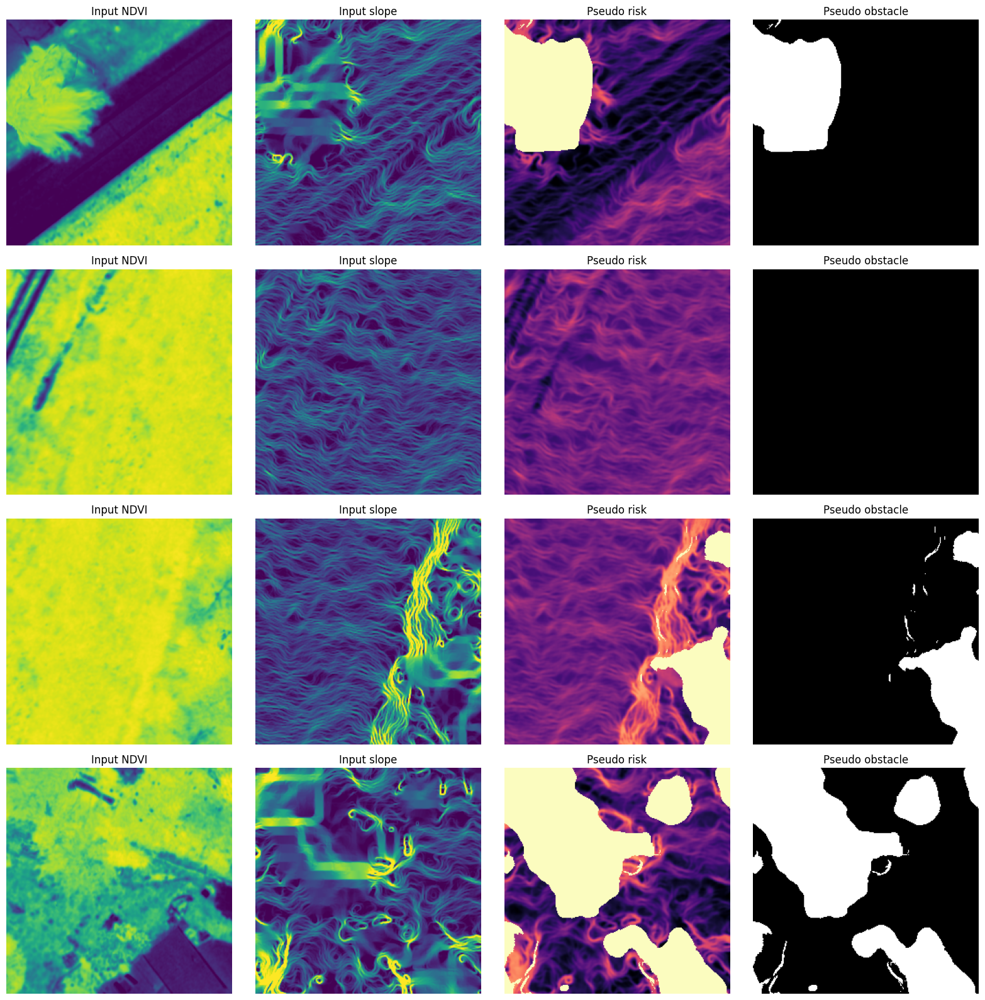

In [31]:
feature_order = [
    "ndvi",
    "ndre",
    "gndvi",
    "ndwi",
    "slope",
    "roughness",
    "rel_height",
    "dtm"
]

num_preview = min(4, len(train_indices))

fig, axes = plt.subplots(num_preview, 4, figsize=(16, 4 * num_preview))

if num_preview == 1:
    axes = axes[None, :]

for i in range(num_preview):
    r, c = train_indices[i]
    
    ndvi_patch = X_stack[feature_order.index("ndvi"), r:r+patch_size, c:c+patch_size]
    slope_patch = X_stack[feature_order.index("slope"), r:r+patch_size, c:c+patch_size]
    risk_patch = pseudo_risk_clean[r:r+patch_size, c:c+patch_size]
    obs_patch = pseudo_obstacle_clean[r:r+patch_size, c:c+patch_size]
    
    axes[i, 0].imshow(ndvi_patch, cmap="viridis", vmin=0, vmax=1)
    axes[i, 0].set_title("Input NDVI")
    axes[i, 0].axis("off")
    
    axes[i, 1].imshow(slope_patch, cmap="viridis", vmin=0, vmax=1)
    axes[i, 1].set_title("Input slope")
    axes[i, 1].axis("off")
    
    axes[i, 2].imshow(risk_patch, cmap="magma", vmin=0, vmax=1)
    axes[i, 2].set_title("Pseudo risk")
    axes[i, 2].axis("off")
    
    axes[i, 3].imshow(obs_patch, cmap="gray", vmin=0, vmax=1)
    axes[i, 3].set_title("Pseudo obstacle")
    axes[i, 3].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(out_dir, "05_patch_preview.png"), dpi=200)
plt.show()

In [32]:
class TraversabilityPatchDataset(Dataset):
    def __init__(
        self,
        X_stack,
        risk_map,
        obstacle_map,
        valid_mask,
        patch_indices,
        patch_size=256,
        augment=False
    ):
        self.X_stack = X_stack.astype(np.float32)
        self.risk_map = risk_map.astype(np.float32)
        self.obstacle_map = obstacle_map.astype(np.float32)
        self.valid_mask = valid_mask.astype(np.float32)
        self.patch_indices = patch_indices
        self.patch_size = patch_size
        self.augment = augment

    def __len__(self):
        return len(self.patch_indices)

    def __getitem__(self, idx):
        r, c = self.patch_indices[idx]
        ps = self.patch_size

        x = self.X_stack[:, r:r+ps, c:c+ps]
        risk = self.risk_map[r:r+ps, c:c+ps][None, :, :]
        obstacle = self.obstacle_map[r:r+ps, c:c+ps][None, :, :]
        mask = self.valid_mask[r:r+ps, c:c+ps][None, :, :]

        # Simple augmentation: flip and rotate
        if self.augment:
            if random.random() < 0.5:
                x = np.flip(x, axis=2).copy()
                risk = np.flip(risk, axis=2).copy()
                obstacle = np.flip(obstacle, axis=2).copy()
                mask = np.flip(mask, axis=2).copy()

            if random.random() < 0.5:
                x = np.flip(x, axis=1).copy()
                risk = np.flip(risk, axis=1).copy()
                obstacle = np.flip(obstacle, axis=1).copy()
                mask = np.flip(mask, axis=1).copy()

            k = random.randint(0, 3)
            if k > 0:
                x = np.rot90(x, k, axes=(1, 2)).copy()
                risk = np.rot90(risk, k, axes=(1, 2)).copy()
                obstacle = np.rot90(obstacle, k, axes=(1, 2)).copy()
                mask = np.rot90(mask, k, axes=(1, 2)).copy()

        return {
            "x": torch.from_numpy(x),
            "risk": torch.from_numpy(risk),
            "obstacle": torch.from_numpy(obstacle),
            "mask": torch.from_numpy(mask)
        }

In [33]:
num_workers = 0

In [34]:
batch_size = 4

train_dataset = TraversabilityPatchDataset(
    X_stack=X_stack,
    risk_map=pseudo_risk_clean,
    obstacle_map=pseudo_obstacle_clean,
    valid_mask=valid_mask,
    patch_indices=train_indices,
    patch_size=patch_size,
    augment=True
)

val_dataset = TraversabilityPatchDataset(
    X_stack=X_stack,
    risk_map=pseudo_risk_clean,
    obstacle_map=pseudo_obstacle_clean,
    valid_mask=valid_mask,
    patch_indices=val_indices,
    patch_size=patch_size,
    augment=False
)

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=0
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=0
)

batch = next(iter(train_loader))

print(batch["x"].shape)
print(batch["risk"].shape)
print(batch["obstacle"].shape)
print(batch["mask"].shape)

torch.Size([4, 8, 256, 256])
torch.Size([4, 1, 256, 256])
torch.Size([4, 1, 256, 256])
torch.Size([4, 1, 256, 256])


In [35]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.net(x)


class SmallUNet(nn.Module):
    def __init__(self, in_channels=8, base_channels=32):
        super().__init__()

        self.enc1 = DoubleConv(in_channels, base_channels)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = DoubleConv(base_channels, base_channels * 2)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = DoubleConv(base_channels * 2, base_channels * 4)
        self.pool3 = nn.MaxPool2d(2)

        self.bottleneck = DoubleConv(base_channels * 4, base_channels * 8)

        self.up3 = nn.ConvTranspose2d(base_channels * 8, base_channels * 4, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(base_channels * 8, base_channels * 4)

        self.up2 = nn.ConvTranspose2d(base_channels * 4, base_channels * 2, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(base_channels * 4, base_channels * 2)

        self.up1 = nn.ConvTranspose2d(base_channels * 2, base_channels, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(base_channels * 2, base_channels)

        # Two heads:
        # 1. risk regression
        # 2. obstacle segmentation
        self.risk_head = nn.Conv2d(base_channels, 1, kernel_size=1)
        self.obstacle_head = nn.Conv2d(base_channels, 1, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        e3 = self.enc3(self.pool2(e2))

        b = self.bottleneck(self.pool3(e3))

        d3 = self.up3(b)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)

        d2 = self.up2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)

        d1 = self.up1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        risk_logit = self.risk_head(d1)
        obstacle_logit = self.obstacle_head(d1)

        return risk_logit, obstacle_logit

In [38]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Using device:", device)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

Using device: cuda
GPU: NVIDIA GeForce RTX 4070 Laptop GPU


In [39]:
model = SmallUNet(in_channels=X_stack.shape[0], base_channels=32).to(device)

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print("Total parameters:", total_params)
print("Trainable parameters:", trainable_params)

Total parameters: 1929890
Trainable parameters: 1929890


In [40]:
def masked_smooth_l1_loss(pred, target, mask):
    """
    pred: [B, 1, H, W], raw logit
    target: [B, 1, H, W], 0-1
    mask: [B, 1, H, W], 0/1
    """
    pred_prob = torch.sigmoid(pred)
    
    loss = F.smooth_l1_loss(
        pred_prob,
        target,
        reduction="none"
    )
    
    loss = loss * mask
    return loss.sum() / (mask.sum() + 1e-6)


def dice_loss_from_logits(logits, targets, mask, eps=1e-6):
    probs = torch.sigmoid(logits)
    
    probs = probs * mask
    targets = targets * mask
    
    intersection = (probs * targets).sum()
    union = probs.sum() + targets.sum()
    
    dice = (2 * intersection + eps) / (union + eps)
    return 1.0 - dice


# compute obstacle positive weight
obs_valid = pseudo_obstacle_clean[valid_mask]
pos = obs_valid.sum()
neg = len(obs_valid) - pos

pos_weight_value = neg / max(pos, 1.0)
pos_weight_value = min(pos_weight_value, 20.0)

print("Obstacle positive pixels:", pos)
print("Obstacle negative pixels:", neg)
print("pos_weight:", pos_weight_value)

bce_loss_fn = nn.BCEWithLogitsLoss(
    pos_weight=torch.tensor([pos_weight_value], dtype=torch.float32, device=device),
    reduction="none"
)


def masked_bce_loss(logits, targets, mask):
    loss = bce_loss_fn(logits, targets)
    loss = loss * mask
    return loss.sum() / (mask.sum() + 1e-6)


def total_loss_fn(risk_logit, obstacle_logit, risk_target, obstacle_target, mask):
    risk_loss = masked_smooth_l1_loss(risk_logit, risk_target, mask)
    bce_loss = masked_bce_loss(obstacle_logit, obstacle_target, mask)
    dice = dice_loss_from_logits(obstacle_logit, obstacle_target, mask)
    
    total = risk_loss + 0.5 * bce_loss + 0.5 * dice
    
    return total, {
        "risk_loss": risk_loss.item(),
        "bce_loss": bce_loss.item(),
        "dice_loss": dice.item()
    }

Obstacle positive pixels: 165296.0
Obstacle negative pixels: 880486.0
pos_weight: 5.326723


In [41]:
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)

In [42]:
def train_one_epoch(model, loader, optimizer, device):
    model.train()
    
    total_loss_sum = 0.0
    risk_loss_sum = 0.0
    bce_loss_sum = 0.0
    dice_loss_sum = 0.0
    
    for batch in loader:
        x = batch["x"].to(device)
        risk = batch["risk"].to(device)
        obstacle = batch["obstacle"].to(device)
        mask = batch["mask"].to(device)

        optimizer.zero_grad()
        
        risk_logit, obstacle_logit = model(x)
        
        loss, loss_dict = total_loss_fn(
            risk_logit,
            obstacle_logit,
            risk,
            obstacle,
            mask
        )
        
        loss.backward()
        optimizer.step()
        
        total_loss_sum += loss.item()
        risk_loss_sum += loss_dict["risk_loss"]
        bce_loss_sum += loss_dict["bce_loss"]
        dice_loss_sum += loss_dict["dice_loss"]
    
    n = len(loader)
    
    return {
        "total": total_loss_sum / n,
        "risk": risk_loss_sum / n,
        "bce": bce_loss_sum / n,
        "dice": dice_loss_sum / n
    }

In [43]:
@torch.no_grad()
def validate_one_epoch(model, loader, device):
    model.eval()
    
    total_loss_sum = 0.0
    risk_loss_sum = 0.0
    bce_loss_sum = 0.0
    dice_loss_sum = 0.0
    
    for batch in loader:
        x = batch["x"].to(device)
        risk = batch["risk"].to(device)
        obstacle = batch["obstacle"].to(device)
        mask = batch["mask"].to(device)
        
        risk_logit, obstacle_logit = model(x)
        
        loss, loss_dict = total_loss_fn(
            risk_logit,
            obstacle_logit,
            risk,
            obstacle,
            mask
        )
        
        total_loss_sum += loss.item()
        risk_loss_sum += loss_dict["risk_loss"]
        bce_loss_sum += loss_dict["bce_loss"]
        dice_loss_sum += loss_dict["dice_loss"]
    
    n = len(loader)
    
    return {
        "total": total_loss_sum / n,
        "risk": risk_loss_sum / n,
        "bce": bce_loss_sum / n,
        "dice": dice_loss_sum / n
    }

In [44]:
num_epochs = 30
best_val_loss = float("inf")

history = {
    "train_total": [],
    "val_total": [],
    "train_risk": [],
    "val_risk": [],
    "train_bce": [],
    "val_bce": [],
    "train_dice": [],
    "val_dice": []
}

model_path = os.path.join(out_dir, "model_best_small_unet.pth")

for epoch in range(1, num_epochs + 1):
    train_metrics = train_one_epoch(model, train_loader, optimizer, device)
    val_metrics = validate_one_epoch(model, val_loader, device)
    
    history["train_total"].append(train_metrics["total"])
    history["val_total"].append(val_metrics["total"])
    history["train_risk"].append(train_metrics["risk"])
    history["val_risk"].append(val_metrics["risk"])
    history["train_bce"].append(train_metrics["bce"])
    history["val_bce"].append(val_metrics["bce"])
    history["train_dice"].append(train_metrics["dice"])
    history["val_dice"].append(val_metrics["dice"])
    
    print(
        f"Epoch {epoch:03d} | "
        f"Train total: {train_metrics['total']:.4f} | "
        f"Val total: {val_metrics['total']:.4f} | "
        f"Train risk: {train_metrics['risk']:.4f} | "
        f"Val risk: {val_metrics['risk']:.4f}"
    )
    
    if val_metrics["total"] < best_val_loss:
        best_val_loss = val_metrics["total"]
        torch.save(
            {
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "epoch": epoch,
                "best_val_loss": best_val_loss,
                "feature_order": feature_order
            },
            model_path
        )
        print("Saved best model.")

Epoch 001 | Train total: 0.7269 | Val total: 1.0002 | Train risk: 0.0564 | Val risk: 0.0480
Saved best model.
Epoch 002 | Train total: 0.5698 | Val total: 0.7850 | Train risk: 0.0478 | Val risk: 0.0500
Saved best model.
Epoch 003 | Train total: 0.4275 | Val total: 0.4383 | Train risk: 0.0428 | Val risk: 0.0471
Saved best model.
Epoch 004 | Train total: 0.4297 | Val total: 0.4271 | Train risk: 0.0328 | Val risk: 0.0351
Saved best model.
Epoch 005 | Train total: 0.3543 | Val total: 0.3610 | Train risk: 0.0261 | Val risk: 0.0284
Saved best model.
Epoch 006 | Train total: 0.3528 | Val total: 0.4215 | Train risk: 0.0215 | Val risk: 0.0244
Epoch 007 | Train total: 0.3124 | Val total: 0.2257 | Train risk: 0.0180 | Val risk: 0.0170
Saved best model.
Epoch 008 | Train total: 0.2766 | Val total: 0.3036 | Train risk: 0.0145 | Val risk: 0.0170
Epoch 009 | Train total: 0.2352 | Val total: 0.2458 | Train risk: 0.0125 | Val risk: 0.0130
Epoch 010 | Train total: 0.2234 | Val total: 0.2210 | Train risk

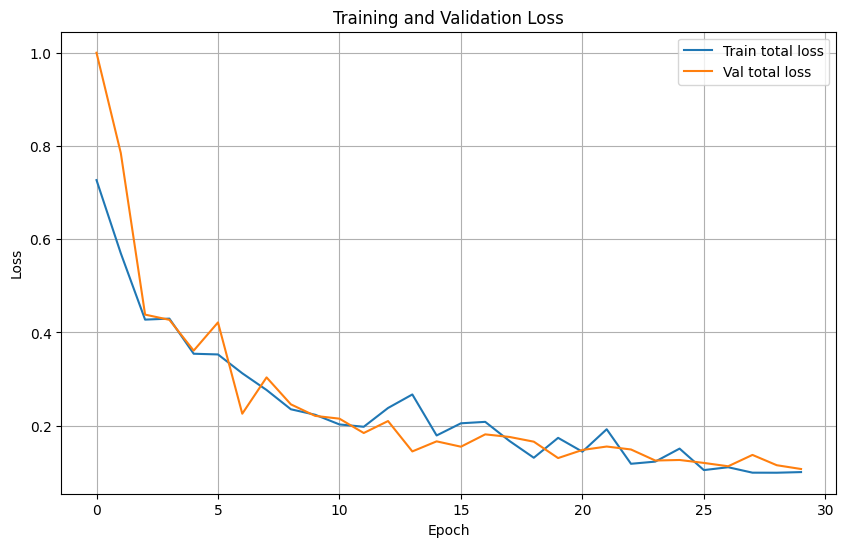

Saved: ../outputs/deep_traversability\06_training_loss_curve.png


In [45]:
plt.figure(figsize=(10, 6))

plt.plot(history["train_total"], label="Train total loss")
plt.plot(history["val_total"], label="Val total loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.grid(True)

save_path = os.path.join(out_dir, "06_training_loss_curve.png")
plt.savefig(save_path, dpi=200)
plt.show()

print("Saved:", save_path)

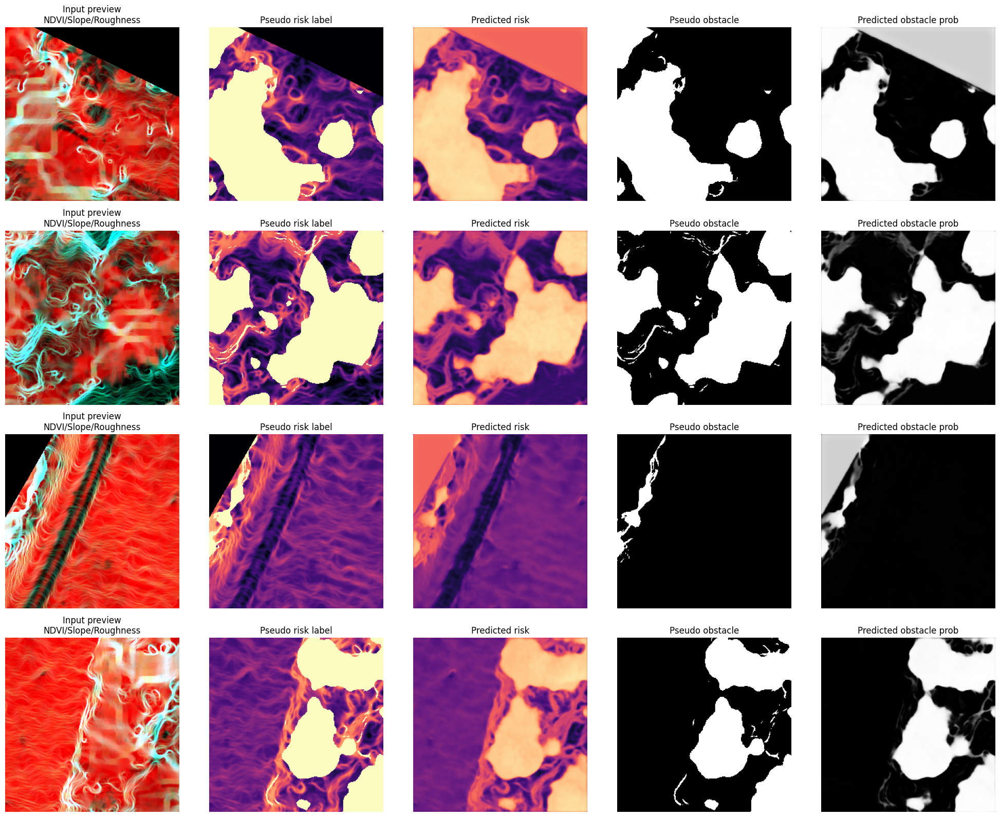

In [46]:
@torch.no_grad()
def visualize_predictions(model, loader, device, save_path, max_samples=4):
    model.eval()
    
    batch = next(iter(loader))
    
    x = batch["x"].to(device)
    risk = batch["risk"].to(device)
    obstacle = batch["obstacle"].to(device)
    mask = batch["mask"].to(device)
    
    risk_logit, obstacle_logit = model(x)
    
    risk_pred = torch.sigmoid(risk_logit).cpu().numpy()
    obstacle_pred = torch.sigmoid(obstacle_logit).cpu().numpy()
    
    x_np = x.cpu().numpy()
    risk_np = risk.cpu().numpy()
    obstacle_np = obstacle.cpu().numpy()
    
    n = min(max_samples, x_np.shape[0])
    
    fig, axes = plt.subplots(n, 5, figsize=(20, 4 * n))
    
    if n == 1:
        axes = axes[None, :]
    
    ndvi_idx = feature_order.index("ndvi")
    slope_idx = feature_order.index("slope")
    rough_idx = feature_order.index("roughness")
    
    for i in range(n):
        # Create pseudo RGB preview from three channels
        preview = np.stack([
            x_np[i, ndvi_idx],
            x_np[i, slope_idx],
            x_np[i, rough_idx]
        ], axis=-1)
        
        preview = np.clip(preview, 0, 1)
        
        axes[i, 0].imshow(preview)
        axes[i, 0].set_title("Input preview\nNDVI/Slope/Roughness")
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(risk_np[i, 0], cmap="magma", vmin=0, vmax=1)
        axes[i, 1].set_title("Pseudo risk label")
        axes[i, 1].axis("off")
        
        axes[i, 2].imshow(risk_pred[i, 0], cmap="magma", vmin=0, vmax=1)
        axes[i, 2].set_title("Predicted risk")
        axes[i, 2].axis("off")
        
        axes[i, 3].imshow(obstacle_np[i, 0], cmap="gray", vmin=0, vmax=1)
        axes[i, 3].set_title("Pseudo obstacle")
        axes[i, 3].axis("off")
        
        axes[i, 4].imshow(obstacle_pred[i, 0], cmap="gray", vmin=0, vmax=1)
        axes[i, 4].set_title("Predicted obstacle prob")
        axes[i, 4].axis("off")
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=200)
    plt.show()


visualize_predictions(
    model,
    val_loader,
    device,
    save_path=os.path.join(out_dir, "07_validation_predictions.png"),
    max_samples=4
)

In [47]:
import os
import json
import math
import heapq
import numpy as np
import matplotlib.pyplot as plt
import torch
import rasterio
from scipy.ndimage import distance_transform_edt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Device:", device)
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

out_dir = "../outputs/deep_traversability"

X_stack = np.load(os.path.join(out_dir, "X_stack.npy"))
valid_mask = np.load(os.path.join(out_dir, "valid_mask.npy")).astype(bool)

print("X_stack:", X_stack.shape)
print("valid_mask:", valid_mask.shape)

Device: cuda
GPU: NVIDIA GeForce RTX 4070 Laptop GPU
X_stack: (8, 1169, 1519)
valid_mask: (1169, 1519)


In [48]:
model_path = os.path.join(out_dir, "model_best_small_unet.pth")

model = SmallUNet(
    in_channels=X_stack.shape[0],
    base_channels=32
).to(device)

checkpoint = torch.load(model_path, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

print("Loaded model from:", model_path)
print("Best val loss:", checkpoint.get("best_val_loss", "unknown"))
print("Epoch:", checkpoint.get("epoch", "unknown"))

Loaded model from: ../outputs/deep_traversability\model_best_small_unet.pth
Best val loss: 0.1070104291041692
Epoch: 30


In [49]:
def make_window_starts(length, patch_size, stride):
    """
    Generate sliding-window start indices and ensure the last window covers the image boundary.
    """
    starts = list(range(0, max(length - patch_size + 1, 1), stride))
    
    last = length - patch_size
    if last < 0:
        last = 0
    
    if len(starts) == 0 or starts[-1] != last:
        starts.append(last)
    
    return starts


@torch.inference_mode()
def sliding_window_inference(
    model,
    X_stack,
    valid_mask,
    patch_size=256,
    stride=128,
    batch_size=4,
    device="cuda"
):
    """
    Full-map inference using overlapping sliding windows.

    Returns:
        predicted_risk_full: [H, W], float32, 0-1
        predicted_obstacle_probability: [H, W], float32, 0-1
    """
    model.eval()
    
    C, H, W = X_stack.shape
    
    risk_sum = np.zeros((H, W), dtype=np.float32)
    obstacle_sum = np.zeros((H, W), dtype=np.float32)
    count_sum = np.zeros((H, W), dtype=np.float32)
    
    row_starts = make_window_starts(H, patch_size, stride)
    col_starts = make_window_starts(W, patch_size, stride)
    
    windows = [(r, c) for r in row_starts for c in col_starts]
    
    print("Total windows:", len(windows))
    
    for i in range(0, len(windows), batch_size):
        batch_windows = windows[i:i+batch_size]
        batch_patches = []
        
        for r, c in batch_windows:
            patch = X_stack[:, r:r+patch_size, c:c+patch_size]
            
            # If image smaller than patch size, pad
            pad_h = patch_size - patch.shape[1]
            pad_w = patch_size - patch.shape[2]
            
            if pad_h > 0 or pad_w > 0:
                patch = np.pad(
                    patch,
                    ((0, 0), (0, pad_h), (0, pad_w)),
                    mode="constant",
                    constant_values=0
                )
            
            batch_patches.append(patch)
        
        x = torch.from_numpy(np.stack(batch_patches, axis=0)).float().to(device)
        
        risk_logit, obstacle_logit = model(x)
        
        risk_pred = torch.sigmoid(risk_logit).cpu().numpy()
        obstacle_pred = torch.sigmoid(obstacle_logit).cpu().numpy()
        
        for j, (r, c) in enumerate(batch_windows):
            h_eff = min(patch_size, H - r)
            w_eff = min(patch_size, W - c)
            
            risk_sum[r:r+h_eff, c:c+w_eff] += risk_pred[j, 0, :h_eff, :w_eff]
            obstacle_sum[r:r+h_eff, c:c+w_eff] += obstacle_pred[j, 0, :h_eff, :w_eff]
            count_sum[r:r+h_eff, c:c+w_eff] += 1.0
        
        if (i // batch_size) % 10 == 0:
            print(f"Processed {min(i + batch_size, len(windows))}/{len(windows)} windows")
    
    predicted_risk_full = risk_sum / np.maximum(count_sum, 1e-6)
    predicted_obstacle_probability = obstacle_sum / np.maximum(count_sum, 1e-6)
    
    predicted_risk_full[~valid_mask] = np.nan
    predicted_obstacle_probability[~valid_mask] = np.nan
    
    return predicted_risk_full, predicted_obstacle_probability

In [50]:
predicted_risk_full, predicted_obstacle_probability = sliding_window_inference(
    model=model,
    X_stack=X_stack,
    valid_mask=valid_mask,
    patch_size=256,
    stride=128,
    batch_size=4,
    device=device
)

print("Predicted risk:", np.nanmin(predicted_risk_full), np.nanmax(predicted_risk_full), np.nanmean(predicted_risk_full))
print("Predicted obstacle probability:", np.nanmin(predicted_obstacle_probability), np.nanmax(predicted_obstacle_probability), np.nanmean(predicted_obstacle_probability))

Total windows: 99
Processed 4/99 windows
Processed 44/99 windows
Processed 84/99 windows
Predicted risk: 0.054679614 0.95383805 0.40626544
Predicted obstacle probability: 0.00048663453 0.9980623 0.1678739


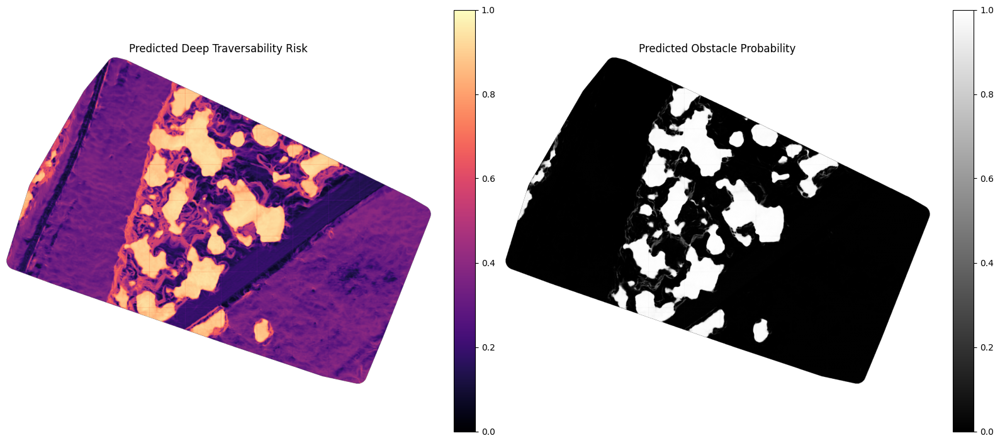

Saved: ../outputs/deep_traversability\08_full_map_deep_predictions.png


In [51]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

im0 = axes[0].imshow(
    np.ma.masked_invalid(predicted_risk_full),
    cmap="magma",
    vmin=0,
    vmax=1
)
axes[0].set_title("Predicted Deep Traversability Risk")
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], fraction=0.046)

im1 = axes[1].imshow(
    np.ma.masked_invalid(predicted_obstacle_probability),
    cmap="gray",
    vmin=0,
    vmax=1
)
axes[1].set_title("Predicted Obstacle Probability")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046)

plt.tight_layout()

save_path = os.path.join(out_dir, "08_full_map_deep_predictions.png")
plt.savefig(save_path, dpi=200)
plt.show()

print("Saved:", save_path)

In [52]:
aligned_dir = "../data_aligned"
dtm_path = os.path.join(aligned_dir, "dtm_aligned.tif")

with rasterio.open(dtm_path) as src:
    ref_profile = src.profile.copy()
    dtm = src.read(1).astype("float32")
    dtm_nodata = src.nodata
    
    if dtm_nodata is not None:
        dtm[dtm == dtm_nodata] = np.nan

print("Reference CRS:", ref_profile["crs"])
print("Reference transform:", ref_profile["transform"])

Reference CRS: EPSG:32633
Reference transform: | 0.09, 0.00, 324482.84|
| 0.00,-0.09, 6006835.83|
| 0.00, 0.00, 1.00|


In [53]:
def save_geotiff(path, arr, ref_profile, dtype="float32", nodata=-9999):
    profile = ref_profile.copy()
    profile.update(
        driver="GTiff",
        dtype=dtype,
        count=1,
        nodata=nodata,
        compress="lzw"
    )
    
    arr_to_save = np.nan_to_num(arr, nan=nodata).astype(dtype)
    
    with rasterio.open(path, "w", **profile) as dst:
        dst.write(arr_to_save, 1)

In [54]:
risk_tif_path = os.path.join(out_dir, "predicted_risk_full.tif")
obstacle_tif_path = os.path.join(out_dir, "predicted_obstacle_probability.tif")

save_geotiff(
    risk_tif_path,
    predicted_risk_full,
    ref_profile,
    dtype="float32",
    nodata=-9999
)

save_geotiff(
    obstacle_tif_path,
    predicted_obstacle_probability,
    ref_profile,
    dtype="float32",
    nodata=-9999
)

print("Saved:", risk_tif_path)
print("Saved:", obstacle_tif_path)

Saved: ../outputs/deep_traversability\predicted_risk_full.tif
Saved: ../outputs/deep_traversability\predicted_obstacle_probability.tif


In [55]:
obstacle_threshold = 0.50

deep_blocked_mask = (
    (~valid_mask) |
    (predicted_obstacle_probability > obstacle_threshold)
)

deep_risk_surface = predicted_risk_full.copy()
deep_risk_surface[deep_blocked_mask] = np.inf

print("Deep blocked ratio inside valid area:", deep_blocked_mask[valid_mask].mean())
print("Deep risk mean:", np.nanmean(predicted_risk_full))

Deep blocked ratio inside valid area: 0.16234071728142194
Deep risk mean: 0.40626544


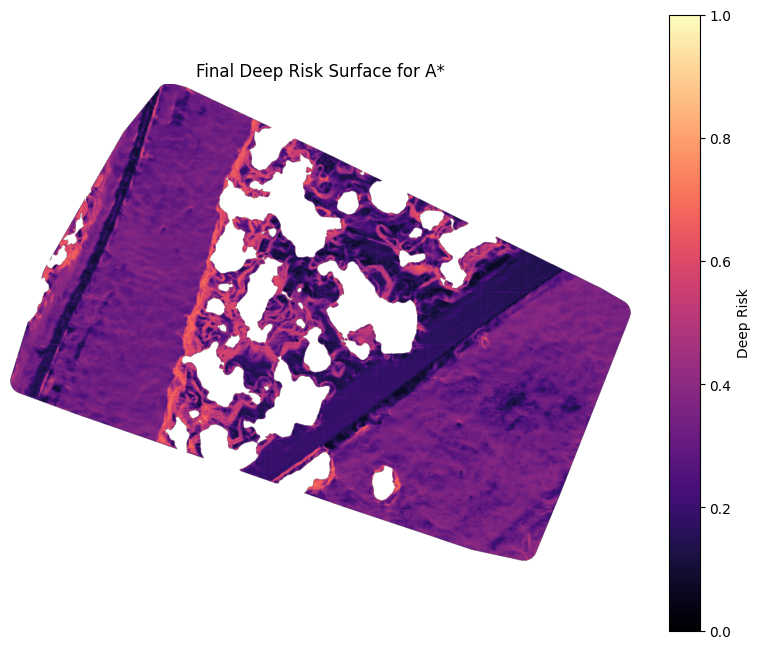

Saved: ../outputs/deep_traversability\09_final_deep_risk_surface_for_astar.png


In [56]:
plt.figure(figsize=(10, 8))

risk_plot = np.ma.masked_where(
    ~np.isfinite(deep_risk_surface),
    deep_risk_surface
)

plt.imshow(risk_plot, cmap="magma", vmin=0, vmax=1)
plt.colorbar(label="Deep Risk")
plt.title("Final Deep Risk Surface for A*")
plt.axis("off")

save_path = os.path.join(out_dir, "09_final_deep_risk_surface_for_astar.png")
plt.savefig(save_path, dpi=200)
plt.show()

print("Saved:", save_path)

In [57]:
def nearest_free_cell(point, free_mask):
    """
    If start or goal is blocked, move it to the nearest free cell.
    """
    r, c = point
    r = int(round(r))
    c = int(round(c))
    
    H, W = free_mask.shape
    r = np.clip(r, 0, H - 1)
    c = np.clip(c, 0, W - 1)
    
    if free_mask[r, c]:
        return (r, c)
    
    _, indices = distance_transform_edt(
        ~free_mask,
        return_indices=True
    )
    
    nr = int(indices[0, r, c])
    nc = int(indices[1, r, c])
    
    return (nr, nc)


def heuristic(a, b):
    return math.hypot(a[0] - b[0], a[1] - b[1])


def get_neighbors_8(node, H, W):
    r, c = node
    
    offsets = [
        (-1, 0), (1, 0), (0, -1), (0, 1),
        (-1, -1), (-1, 1), (1, -1), (1, 1)
    ]
    
    for dr, dc in offsets:
        nr = r + dr
        nc = c + dc
        
        if 0 <= nr < H and 0 <= nc < W:
            yield (nr, nc)


def deep_risk_astar(
    risk_surface,
    blocked_mask,
    start,
    goal,
    lambda_risk=8.0
):
    """
    A* on predicted deep risk map.

    Edge cost:
        geometric distance * (1 + lambda_risk * average risk)
    """
    H, W = risk_surface.shape
    
    free_mask = (~blocked_mask) & np.isfinite(risk_surface)
    
    start = nearest_free_cell(start, free_mask)
    goal = nearest_free_cell(goal, free_mask)
    
    print("Adjusted start:", start)
    print("Adjusted goal:", goal)
    print("Start risk:", risk_surface[start])
    print("Goal risk:", risk_surface[goal])
    
    open_heap = []
    heapq.heappush(open_heap, (heuristic(start, goal), 0, start))
    
    came_from = {}
    g_score = {start: 0.0}
    closed = set()
    counter = 0
    
    while open_heap:
        _, _, current = heapq.heappop(open_heap)
        
        if current in closed:
            continue
        
        if current == goal:
            path = [current]
            while current in came_from:
                current = came_from[current]
                path.append(current)
            path.reverse()
            return np.array(path)
        
        closed.add(current)
        
        for neighbor in get_neighbors_8(current, H, W):
            if neighbor in closed:
                continue
            
            if blocked_mask[neighbor]:
                continue
            
            if not np.isfinite(risk_surface[neighbor]):
                continue
            
            dist = heuristic(current, neighbor)
            avg_risk = 0.5 * (risk_surface[current] + risk_surface[neighbor])
            
            step_cost = dist * (1.0 + lambda_risk * avg_risk)
            
            tentative_g = g_score[current] + step_cost
            
            if neighbor not in g_score or tentative_g < g_score[neighbor]:
                came_from[neighbor] = current
                g_score[neighbor] = tentative_g
                
                counter += 1
                f_score = tentative_g + heuristic(neighbor, goal)
                heapq.heappush(open_heap, (f_score, counter, neighbor))
    
    return None

In [58]:
H, W = predicted_risk_full.shape

start = (int(H * 0.15), int(W * 0.15))
goal = (int(H * 0.85), int(W * 0.85))

print("Start:", start)
print("Goal:", goal)

Start: (175, 227)
Goal: (993, 1291)


In [61]:
start = (500, 300)
goal = (900, 1200)

In [62]:
deep_path = deep_risk_astar(
    risk_surface=deep_risk_surface,
    blocked_mask=deep_blocked_mask,
    start=start,
    goal=goal,
    lambda_risk=8.0
)

if deep_path is None:
    print("No path found.")
else:
    print("Deep path found.")
    print("Path shape:", deep_path.shape)
    print("First:", deep_path[0])
    print("Last:", deep_path[-1])

Adjusted start: (np.int64(500), np.int64(300))
Adjusted goal: (np.int64(900), np.int64(1200))
Start risk: 0.34670112
Goal risk: 0.39324754
Deep path found.
Path shape: (908, 2)
First: [500 300]
Last: [ 900 1200]


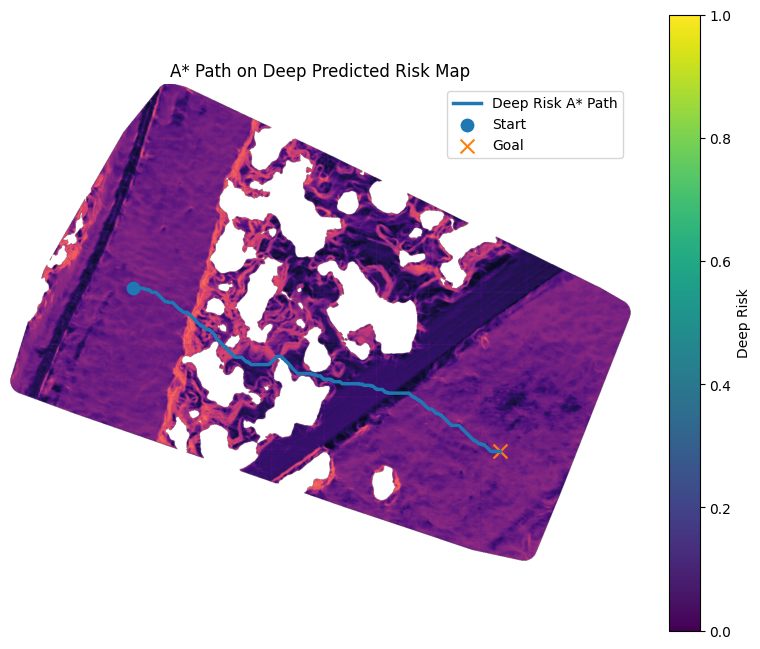

Saved: ../outputs/deep_traversability\10_deep_astar_path_on_risk_map.png


In [63]:
if deep_path is not None:
    plt.figure(figsize=(10, 8))
    
    risk_plot = np.ma.masked_where(
        ~np.isfinite(deep_risk_surface),
        deep_risk_surface
    )
    
    plt.imshow(risk_plot, cmap="magma", vmin=0, vmax=1)
    
    plt.plot(
        deep_path[:, 1],
        deep_path[:, 0],
        linewidth=2.5,
        label="Deep Risk A* Path"
    )
    
    plt.scatter(
        deep_path[0, 1],
        deep_path[0, 0],
        s=80,
        marker="o",
        label="Start"
    )
    
    plt.scatter(
        deep_path[-1, 1],
        deep_path[-1, 0],
        s=100,
        marker="x",
        label="Goal"
    )
    
    plt.colorbar(label="Deep Risk")
    plt.title("A* Path on Deep Predicted Risk Map")
    plt.legend()
    plt.axis("off")
    
    save_path = os.path.join(out_dir, "10_deep_astar_path_on_risk_map.png")
    plt.savefig(save_path, dpi=200)
    plt.show()
    
    print("Saved:", save_path)

In [64]:
if deep_path is not None:
    path_pixel_csv = os.path.join(out_dir, "deep_astar_path_pixels.csv")
    
    np.savetxt(
        path_pixel_csv,
        deep_path,
        delimiter=",",
        header="row,col",
        comments="",
        fmt="%d"
    )
    
    print("Saved:", path_pixel_csv)

Saved: ../outputs/deep_traversability\deep_astar_path_pixels.csv


In [65]:
def pixel_to_world(row, col, transform):
    x, y = rasterio.transform.xy(transform, row, col)
    return x, y


if deep_path is not None:
    transform = ref_profile["transform"]
    
    xyz_path = []
    
    for r, c in deep_path:
        r = int(r)
        c = int(c)
        
        x, y = pixel_to_world(r, c, transform)
        z = dtm[r, c]
        
        xyz_path.append((x, y, z))
    
    xyz_path = np.array(xyz_path)
    
    path_xyz_csv = os.path.join(out_dir, "deep_astar_path_xyz.csv")
    
    np.savetxt(
        path_xyz_csv,
        xyz_path,
        delimiter=",",
        header="x,y,z",
        comments="",
        fmt="%.6f"
    )
    
    print("Saved:", path_xyz_csv)
    print("XYZ path shape:", xyz_path.shape)

Saved: ../outputs/deep_traversability\deep_astar_path_xyz.csv
XYZ path shape: (908, 3)


In [66]:
def evaluate_deep_path(path, risk_map, obstacle_prob, blocked_mask, dtm, ref_profile):
    resolution = abs(ref_profile["transform"][0])
    
    length_pixels = 0.0
    
    for i in range(1, len(path)):
        dr = path[i, 0] - path[i - 1, 0]
        dc = path[i, 1] - path[i - 1, 1]
        length_pixels += math.hypot(dr, dc)
    
    length_meters = length_pixels * resolution
    
    rows = path[:, 0].astype(int)
    cols = path[:, 1].astype(int)
    
    path_risk = risk_map[rows, cols]
    path_obstacle_prob = obstacle_prob[rows, cols]
    path_z = dtm[rows, cols]
    
    metrics = {
        "path_points": int(len(path)),
        "length_pixels": float(length_pixels),
        "length_meters": float(length_meters),
        "mean_predicted_risk": float(np.nanmean(path_risk)),
        "max_predicted_risk": float(np.nanmax(path_risk)),
        "mean_obstacle_probability": float(np.nanmean(path_obstacle_prob)),
        "max_obstacle_probability": float(np.nanmax(path_obstacle_prob)),
        "collision_count": int(np.sum(blocked_mask[rows, cols])),
        "mean_elevation": float(np.nanmean(path_z)),
        "min_elevation": float(np.nanmin(path_z)),
        "max_elevation": float(np.nanmax(path_z))
    }
    
    return metrics


if deep_path is not None:
    deep_metrics = evaluate_deep_path(
        path=deep_path,
        risk_map=predicted_risk_full,
        obstacle_prob=predicted_obstacle_probability,
        blocked_mask=deep_blocked_mask,
        dtm=dtm,
        ref_profile=ref_profile
    )
    
    for k, v in deep_metrics.items():
        print(f"{k}: {v}")
    
    metrics_path = os.path.join(out_dir, "deep_astar_path_metrics.json")
    
    with open(metrics_path, "w") as f:
        json.dump(deep_metrics, f, indent=4)
    
    print("Saved:", metrics_path)

path_points: 908
length_pixels: 1086.3544725075544
length_meters: 98.97915020581664
mean_predicted_risk: 0.24891632795333862
max_predicted_risk: 0.6595845222473145
mean_obstacle_probability: 0.015682335942983627
max_obstacle_probability: 0.4686870872974396
collision_count: 0
mean_elevation: 18.582719802856445
min_elevation: 14.079999923706055
max_elevation: 23.231571197509766
Saved: ../outputs/deep_traversability\deep_astar_path_metrics.json


In [67]:
rows = deep_path[:, 0].astype(int)
cols = deep_path[:, 1].astype(int)

path_risks = predicted_risk_full[rows, cols]
path_obs_probs = predicted_obstacle_probability[rows, cols]

top_k = 10
idx_sorted = np.argsort(path_risks)[-top_k:][::-1]

print("Top high-risk points along path:")

for idx in idx_sorted:
    r, c = rows[idx], cols[idx]
    print(
        f"index={idx}, row={r}, col={c}, "
        f"risk={predicted_risk_full[r, c]:.3f}, "
        f"obs_prob={predicted_obstacle_probability[r, c]:.3f}"
    )

Top high-risk points along path:
index=147, row=572, col=447, risk=0.660, obs_prob=0.082
index=148, row=573, col=448, risk=0.654, obs_prob=0.085
index=143, row=568, col=443, risk=0.648, obs_prob=0.085
index=146, row=571, col=446, risk=0.645, obs_prob=0.113
index=151, row=576, col=451, risk=0.633, obs_prob=0.127
index=142, row=567, col=442, risk=0.631, obs_prob=0.027
index=145, row=570, col=445, risk=0.627, obs_prob=0.160
index=149, row=574, col=449, risk=0.624, obs_prob=0.161
index=144, row=569, col=444, risk=0.620, obs_prob=0.158
index=152, row=577, col=452, risk=0.617, obs_prob=0.012


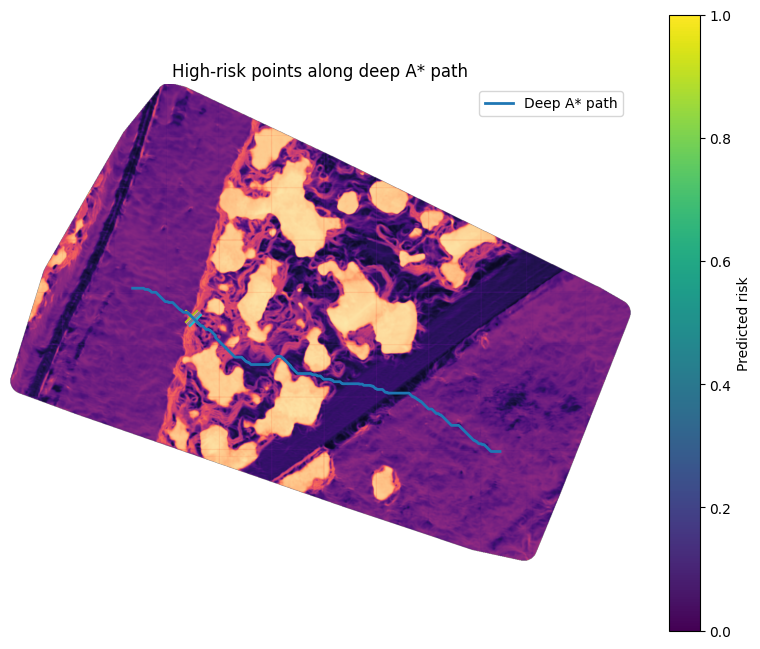

In [68]:
plt.figure(figsize=(10, 8))

plt.imshow(
    np.ma.masked_invalid(predicted_risk_full),
    cmap="magma",
    vmin=0,
    vmax=1
)

plt.plot(deep_path[:, 1], deep_path[:, 0], linewidth=2, label="Deep A* path")

for idx in idx_sorted:
    r, c = rows[idx], cols[idx]
    plt.scatter(c, r, s=80, marker="x")

plt.colorbar(label="Predicted risk")
plt.title("High-risk points along deep A* path")
plt.legend()
plt.axis("off")
plt.show()

In [69]:
near_obstacle_points = np.where(path_obs_probs > 0.40)[0]

print("Number of path points with obstacle probability > 0.40:", len(near_obstacle_points))

for idx in near_obstacle_points[:20]:
    r, c = rows[idx], cols[idx]
    print(
        f"index={idx}, row={r}, col={c}, "
        f"risk={predicted_risk_full[r, c]:.3f}, "
        f"obs_prob={predicted_obstacle_probability[r, c]:.3f}"
    )

Number of path points with obstacle probability > 0.40: 2
index=366, row=667, col=661, risk=0.563, obs_prob=0.440
index=367, row=667, col=662, risk=0.570, obs_prob=0.469
